#### Problem Statement:
- Using the dataset to develop a model that can recognize the images with fire.

#### Content
- Data was collected to train a model to distinguish between the images that contain fire (fire images) and regular images (non-fire images), so the whole problem was binary classification.

- Data is divided into 2 folders, fireimages folder contains 755 outdoor-fire images some of them contains heavy smoke, the other one is non-fireimages which contain 244 nature images (eg: forest, tree, grass, river, people, foggy forest, lake, animal, road, and waterfall).


#### Importing libraries 

In [55]:
#GENERAL
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
#PATH PROCESS
import os
import os.path
from pathlib import Path
import glob
#IMAGE PROCESS
from PIL import Image
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
from keras.applications.vgg16 import preprocess_input, decode_predictions
#SCALER & TRANSFORMATION
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from keras.utils.np_utils import to_categorical
from sklearn.model_selection import train_test_split
from keras import regularizers
from sklearn.preprocessing import LabelEncoder
#ACCURACY CONTROL
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, roc_auc_score, roc_curve
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score
#OPTIMIZER
from keras.optimizers import RMSprop,Adam,Optimizer,Optimizer
#MODEL LAYERS
from tensorflow.keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, BatchNormalization,MaxPooling2D,BatchNormalization,\
                        Permute, TimeDistributed, Bidirectional,GRU, SimpleRNN, LSTM, GlobalAveragePooling2D, SeparableConv2D
from keras import models
from keras import layers
import tensorflow as tf
from keras.applications import VGG16,VGG19,inception_v3
from keras import backend as K
from keras.utils import plot_model


In [3]:
!pip install catboost

In [4]:

#SKLEARN CLASSIFIER
from xgboost import XGBClassifier, XGBRegressor
from lightgbm import LGBMClassifier, LGBMRegressor
from catboost import CatBoostClassifier, CatBoostRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.ensemble import GradientBoostingClassifier, GradientBoostingRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.neural_network import MLPClassifier, MLPRegressor
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.linear_model import LinearRegression
from sklearn.cross_decomposition import PLSRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import ElasticNetCV
#IGNORING WARNINGS
from warnings import filterwarnings
filterwarnings("ignore",category=DeprecationWarning)
filterwarnings("ignore", category=FutureWarning) 
filterwarnings("ignore", category=UserWarning)

#### Path & Label Process

In [10]:
Fire_Dataset_Path = Path("C:/Users/DELL/OneDrive/Documents/StarAgile/Assessment/Capstone Project/Forest fire prediction/Images")

#### Path Process

In [11]:
PNG_Path = list(Fire_Dataset_Path.glob(r"*/*.png"))

#### Label Process

In [12]:
PNG_Labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1],PNG_Path))

In [13]:
print("FIRE: ", PNG_Labels.count("fire_images"))
print("NO_FIRE: ", PNG_Labels.count("non_fire_images"))

FIRE:  755
NO_FIRE:  244


#### Transformation to Series structure

In [14]:
PNG_Path_Series = pd.Series(PNG_Path,name="PNG").astype(str)
PNG_Labels_Series = pd.Series(PNG_Labels,name="CATEGORY")

In [15]:
print(PNG_Path_Series)

0      C:\Users\DELL\OneDrive\Documents\StarAgile\Ass...
1      C:\Users\DELL\OneDrive\Documents\StarAgile\Ass...
2      C:\Users\DELL\OneDrive\Documents\StarAgile\Ass...
3      C:\Users\DELL\OneDrive\Documents\StarAgile\Ass...
4      C:\Users\DELL\OneDrive\Documents\StarAgile\Ass...
                             ...                        
994    C:\Users\DELL\OneDrive\Documents\StarAgile\Ass...
995    C:\Users\DELL\OneDrive\Documents\StarAgile\Ass...
996    C:\Users\DELL\OneDrive\Documents\StarAgile\Ass...
997    C:\Users\DELL\OneDrive\Documents\StarAgile\Ass...
998    C:\Users\DELL\OneDrive\Documents\StarAgile\Ass...
Name: PNG, Length: 999, dtype: object


In [16]:
print(PNG_Labels_Series)

0          fire_images
1          fire_images
2          fire_images
3          fire_images
4          fire_images
            ...       
994    non_fire_images
995    non_fire_images
996    non_fire_images
997    non_fire_images
998    non_fire_images
Name: CATEGORY, Length: 999, dtype: object


In [17]:
PNG_Labels_Series.replace({"non_fire_images":"NO_FIRE","fire_images":"FIRE"},inplace=True)

In [18]:
print(PNG_Labels_Series)

0         FIRE
1         FIRE
2         FIRE
3         FIRE
4         FIRE
        ...   
994    NO_FIRE
995    NO_FIRE
996    NO_FIRE
997    NO_FIRE
998    NO_FIRE
Name: CATEGORY, Length: 999, dtype: object


#### Transformation to DataFrame structure

In [19]:
Main_Train_Data = pd.concat([PNG_Path_Series,PNG_Labels_Series],axis=1)

In [20]:
print(Main_Train_Data.head(-1))

                                                   PNG CATEGORY
0    C:\Users\DELL\OneDrive\Documents\StarAgile\Ass...     FIRE
1    C:\Users\DELL\OneDrive\Documents\StarAgile\Ass...     FIRE
2    C:\Users\DELL\OneDrive\Documents\StarAgile\Ass...     FIRE
3    C:\Users\DELL\OneDrive\Documents\StarAgile\Ass...     FIRE
4    C:\Users\DELL\OneDrive\Documents\StarAgile\Ass...     FIRE
..                                                 ...      ...
993  C:\Users\DELL\OneDrive\Documents\StarAgile\Ass...  NO_FIRE
994  C:\Users\DELL\OneDrive\Documents\StarAgile\Ass...  NO_FIRE
995  C:\Users\DELL\OneDrive\Documents\StarAgile\Ass...  NO_FIRE
996  C:\Users\DELL\OneDrive\Documents\StarAgile\Ass...  NO_FIRE
997  C:\Users\DELL\OneDrive\Documents\StarAgile\Ass...  NO_FIRE

[998 rows x 2 columns]


#### Shuffling

In [21]:
Main_Train_Data = Main_Train_Data.sample(frac=1).reset_index(drop=True)

In [22]:
print(Main_Train_Data.head(-1))

                                                   PNG CATEGORY
0    C:\Users\DELL\OneDrive\Documents\StarAgile\Ass...     FIRE
1    C:\Users\DELL\OneDrive\Documents\StarAgile\Ass...     FIRE
2    C:\Users\DELL\OneDrive\Documents\StarAgile\Ass...     FIRE
3    C:\Users\DELL\OneDrive\Documents\StarAgile\Ass...     FIRE
4    C:\Users\DELL\OneDrive\Documents\StarAgile\Ass...     FIRE
..                                                 ...      ...
993  C:\Users\DELL\OneDrive\Documents\StarAgile\Ass...     FIRE
994  C:\Users\DELL\OneDrive\Documents\StarAgile\Ass...  NO_FIRE
995  C:\Users\DELL\OneDrive\Documents\StarAgile\Ass...  NO_FIRE
996  C:\Users\DELL\OneDrive\Documents\StarAgile\Ass...     FIRE
997  C:\Users\DELL\OneDrive\Documents\StarAgile\Ass...  NO_FIRE

[998 rows x 2 columns]


In [23]:
print(Main_Train_Data["PNG"][2])
print(Main_Train_Data["CATEGORY"][2])
print(Main_Train_Data["PNG"][200])
print(Main_Train_Data["CATEGORY"][200])
print(Main_Train_Data["PNG"][45])
print(Main_Train_Data["CATEGORY"][45])
print(Main_Train_Data["PNG"][852])
print(Main_Train_Data["CATEGORY"][852])

C:\Users\DELL\OneDrive\Documents\StarAgile\Assessment\Capstone Project\Forest fire prediction\Images\fire_images\fire.1.png
FIRE
C:\Users\DELL\OneDrive\Documents\StarAgile\Assessment\Capstone Project\Forest fire prediction\Images\fire_images\fire.263.png
FIRE
C:\Users\DELL\OneDrive\Documents\StarAgile\Assessment\Capstone Project\Forest fire prediction\Images\fire_images\fire.728.png
FIRE
C:\Users\DELL\OneDrive\Documents\StarAgile\Assessment\Capstone Project\Forest fire prediction\Images\fire_images\fire.469.png
FIRE


#### Visualization

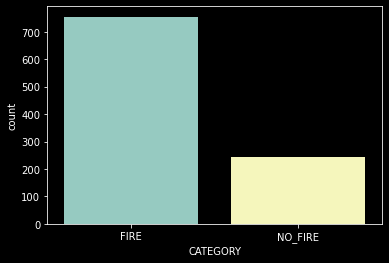

In [27]:
plt.style.use("dark_background")
sns.countplot(Main_Train_Data["CATEGORY"])
plt.show()

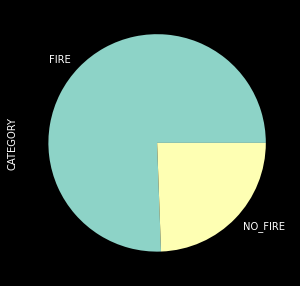

In [28]:
Main_Train_Data['CATEGORY'].value_counts().plot.pie(figsize=(5,5))
plt.show()

#### Images

Text(0.5, 1.0, 'FIRE')

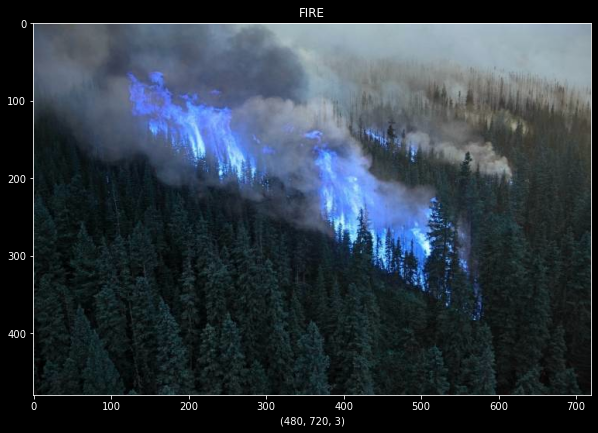

In [37]:
figure = plt.figure(figsize=(10,10))
x = cv2.imread(Main_Train_Data["PNG"][13])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(Main_Train_Data["CATEGORY"][13])

Text(0.5, 1.0, 'FIRE')

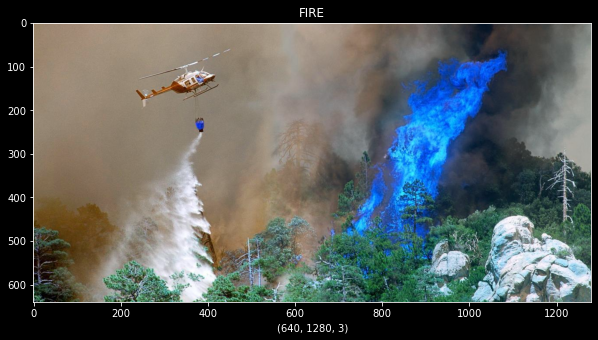

In [31]:
figure = plt.figure(figsize=(10,10))
x = cv2.imread(Main_Train_Data["PNG"][993])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(Main_Train_Data["CATEGORY"][993])

Text(0.5, 1.0, 'NO_FIRE')

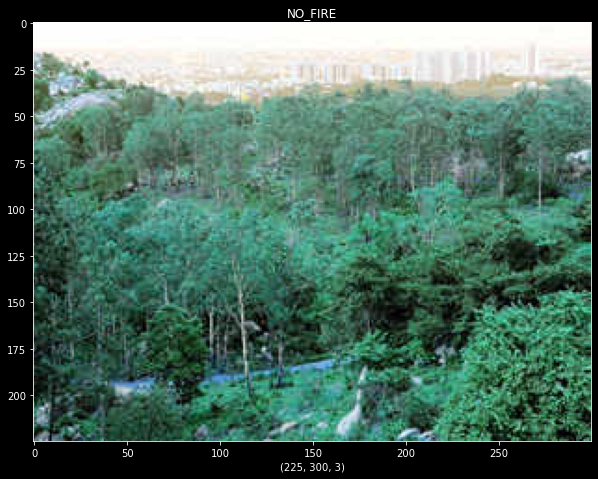

In [38]:
figure = plt.figure(figsize=(10,10))
x = cv2.imread(Main_Train_Data["PNG"][20])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(Main_Train_Data["CATEGORY"][20])

Text(0.5, 1.0, 'NO_FIRE')

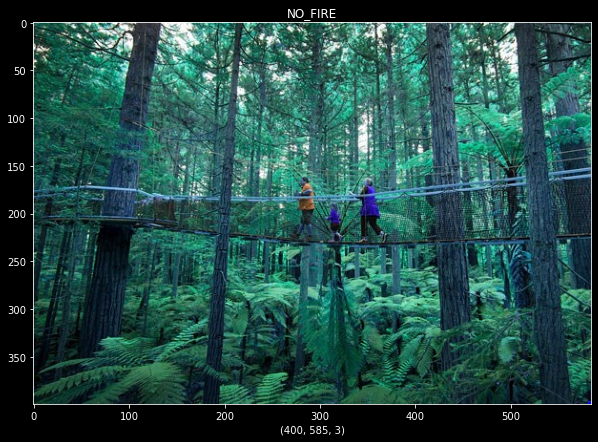

In [39]:
figure = plt.figure(figsize=(10,10))
x = cv2.imread(Main_Train_Data["PNG"][48])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(Main_Train_Data["CATEGORY"][48])

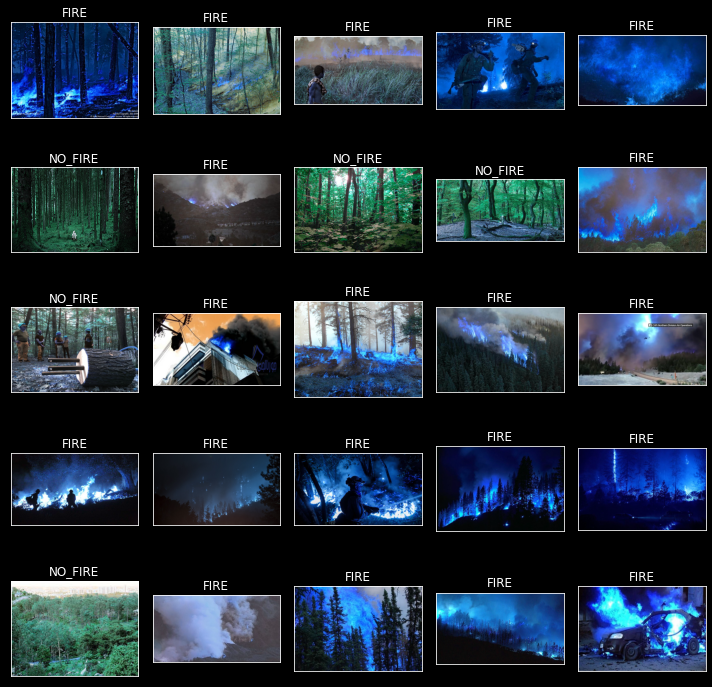

In [40]:
fig, axes = plt.subplots(nrows=5,
                        ncols=5,
                        figsize=(10,10),
                        subplot_kw={"xticks":[],"yticks":[]})

for i,ax in enumerate(axes.flat):
    ax.imshow(cv2.imread(Main_Train_Data["PNG"][i]))
    ax.set_title(Main_Train_Data["CATEGORY"][i])
plt.tight_layout()
plt.show()

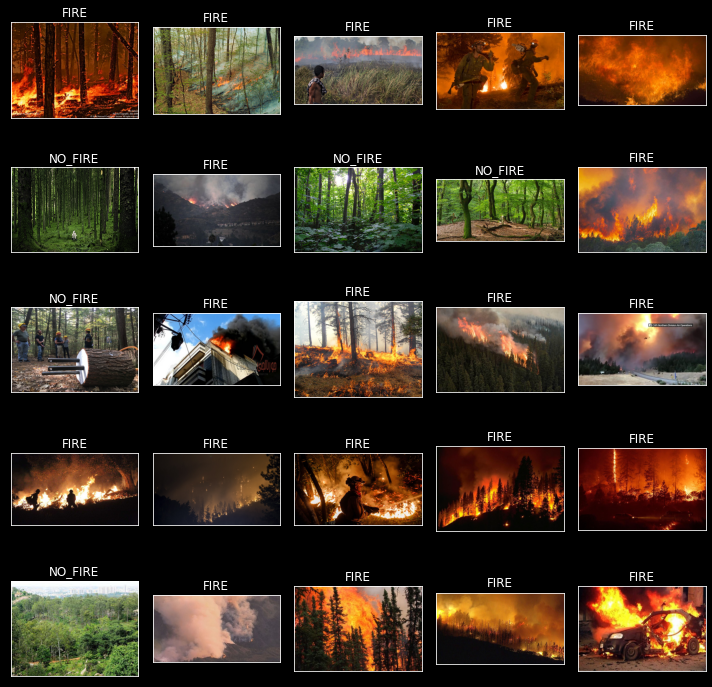

In [41]:
fig, axes = plt.subplots(nrows=5,
                        ncols=5,
                        figsize=(10,10),
                        subplot_kw={"xticks":[],"yticks":[]})

for i,ax in enumerate(axes.flat):
    x = cv2.imread(Main_Train_Data["PNG"][i])
    x = cv2.cvtColor(x,cv2.COLOR_RGB2BGR)
    ax.imshow(x)
    ax.set_title(Main_Train_Data["CATEGORY"][i])
plt.tight_layout()
plt.show()

#### Train & Test data

#### Image Generator

In [42]:
Train_Generator = ImageDataGenerator(rescale=1./255,
                                    shear_range=0.3,
                                    zoom_range=0.2,
                                    brightness_range=[0.2,0.9],
                                    rotation_range=30,
                                    horizontal_flip=True,
                                    vertical_flip=True,
                                    fill_mode="nearest",
                                    validation_split=0.1)

In [43]:
Test_Generator = ImageDataGenerator(rescale=1./255)

#### Splitting data into train & test 

In [44]:
Train_Data,Test_Data = train_test_split(Main_Train_Data,train_size=0.9,random_state=42,shuffle=True)

In [45]:
print("TRAIN SHAPE: ",Train_Data.shape)
print("TEST SHAPE: ",Test_Data.shape)

TRAIN SHAPE:  (899, 2)
TEST SHAPE:  (100, 2)


In [46]:
print(Test_Data["CATEGORY"].value_counts())

FIRE       69
NO_FIRE    31
Name: CATEGORY, dtype: int64


In [47]:
encode = LabelEncoder()

In [48]:
For_Prediction_Class = encode.fit_transform(Test_Data["CATEGORY"])

#### How generatr image look like

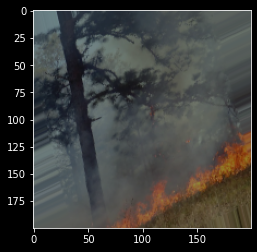

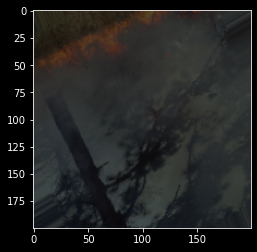

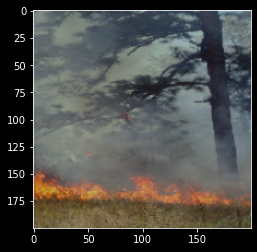

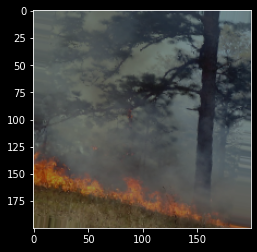

In [58]:
from tensorflow.keras.utils import load_img
example_Image = Train_Data["PNG"][99]
Load_Image = tf.keras.utils.load_img(example_Image,target_size=(200,200))
Array_Image = tf.keras.utils.img_to_array(Load_Image)
Array_Image = Array_Image.reshape((1,) + Array_Image.shape)

i = 0
for batch in Train_Generator.flow(Array_Image,batch_size=1):
    plt.figure(i)
    IMG = plt.imshow(tf.keras.utils.img_to_array(batch[0]))
    i += 1
    if i % 4 == 0:
        break
plt.show()

#### Applying Generator & Transformer to Tensor

In [59]:
Train_IMG_Set = Train_Generator.flow_from_dataframe(dataframe=Train_Data,
                                                   x_col="PNG",
                                                   y_col="CATEGORY",
                                                   color_mode="rgb",
                                                   class_mode="categorical",
                                                   batch_size=32,
                                                   subset="training")

Found 810 validated image filenames belonging to 2 classes.


In [60]:
Validation_IMG_Set = Train_Generator.flow_from_dataframe(dataframe=Train_Data,
                                                   x_col="PNG",
                                                   y_col="CATEGORY",
                                                   color_mode="rgb",
                                                   class_mode="categorical",
                                                   batch_size=32,
                                                   subset="validation")

Found 89 validated image filenames belonging to 2 classes.


In [61]:
Test_IMG_Set = Test_Generator.flow_from_dataframe(dataframe=Test_Data,
                                                 x_col="PNG",
                                                 y_col="CATEGORY",
                                                 color_mode="rgb",
                                                 class_mode="categorical",
                                                 batch_size=32)

Found 100 validated image filenames belonging to 2 classes.


In [62]:
for data_batch,label_batch in Train_IMG_Set:
    print("DATA SHAPE: ",data_batch.shape)
    print("LABEL SHAPE: ",label_batch.shape)
    break

DATA SHAPE:  (32, 256, 256, 3)
LABEL SHAPE:  (32, 2)


In [63]:
for data_batch,label_batch in Validation_IMG_Set:
    print("DATA SHAPE: ",data_batch.shape)
    print("LABEL SHAPE: ",label_batch.shape)
    break

DATA SHAPE:  (32, 256, 256, 3)
LABEL SHAPE:  (32, 2)


In [64]:
for data_batch,label_batch in Test_IMG_Set:
    print("DATA SHAPE: ",data_batch.shape)
    print("LABEL SHAPE: ",label_batch.shape)
    break

DATA SHAPE:  (32, 256, 256, 3)
LABEL SHAPE:  (32, 2)


In [65]:
print("TRAIN: ")
print(Train_IMG_Set.class_indices)
print(Train_IMG_Set.classes[0:5])
print(Train_IMG_Set.image_shape)
print("---"*20)
print("VALIDATION: ")
print(Validation_IMG_Set.class_indices)
print(Validation_IMG_Set.classes[0:5])
print(Validation_IMG_Set.image_shape)
print("---"*20)
print("TEST: ")
print(Test_IMG_Set.class_indices)
print(Test_IMG_Set.classes[0:5])
print(Test_IMG_Set.image_shape)

TRAIN: 
{'FIRE': 0, 'NO_FIRE': 1}
[0, 0, 0, 0, 0]
(256, 256, 3)
------------------------------------------------------------
VALIDATION: 
{'FIRE': 0, 'NO_FIRE': 1}
[0, 0, 0, 0, 1]
(256, 256, 3)
------------------------------------------------------------
TEST: 
{'FIRE': 0, 'NO_FIRE': 1}
[0, 0, 1, 0, 0]
(256, 256, 3)


## CNN

In [90]:
Model = Sequential()

Model.add(Conv2D(32,(3,3),activation="softmax",
                 input_shape=(256,256,3)))
Model.add(BatchNormalization())
Model.add(MaxPooling2D((2,2)))

#
Model.add(Conv2D(64,(3,3),
                 activation="softmax",padding="same"))
Model.add(Dropout(0.2))
Model.add(MaxPooling2D((2,2)))

#
Model.add(Conv2D(128,(3,3),
                 activation="softmax",padding="same"))
Model.add(Dropout(0.5))
Model.add(MaxPooling2D((2,2)))


#
Model.add(Flatten())
Model.add(Dense(256,activation="softmax"))
Model.add(Dropout(0.5))
Model.add(Dense(1,activation="sigmoid"))

In [91]:
Call_Back = tf.keras.callbacks.EarlyStopping(monitor="loss",patience=5,mode="min")

In [92]:
Model.compile(optimizer="rmsprop",loss="binary_crossentropy",metrics=["accuracy"])

In [93]:
CNN_Model = Model.fit(Train_IMG_Set,
                      validation_data=Validation_IMG_Set,
                            callbacks=Call_Back,
                      epochs=10)

Epoch 1/10
26/26 [==============================] - 247s 9s/step - loss: 0.6932 - accuracy: 0.5000 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 2/10
26/26 [==============================] - 220s 8s/step - loss: 0.6931 - accuracy: 0.5000 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 3/10
26/26 [==============================] - 231s 9s/step - loss: 0.6931 - accuracy: 0.5000 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 4/10
26/26 [==============================] - 227s 9s/step - loss: 0.6931 - accuracy: 0.5000 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 5/10
26/26 [==============================] - 228s 9s/step - loss: 0.6931 - accuracy: 0.5000 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 6/10
26/26 [==============================] - 239s 9s/step - loss: 0.6931 - accuracy: 0.5000 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 7/10
26/26 [==============================] - 256s 10s/step - loss: 0.6931 - accuracy: 0.5000 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 8/10
2

In [94]:
print(Model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 254, 254, 32)      896       
                                                                 
 batch_normalization_1 (Batc  (None, 254, 254, 32)     128       
 hNormalization)                                                 
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 127, 127, 32)     0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 127, 127, 64)      18496     
                                                                 
 dropout_3 (Dropout)         (None, 127, 127, 64)      0         
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 63, 63, 64)      

In [95]:
Model_Results = Model.evaluate(Test_IMG_Set)
print("LOSS:  " + "%.4f" % Model_Results[0])
print("ACCURACY:  " + "%.2f" % Model_Results[1])

4/4 [==============================] - 8s 1s/step - loss: 0.6931 - accuracy: 0.5000
LOSS:  0.6931
ACCURACY:  0.50


#### Prediction

In [96]:
Prediction_One = Model.predict(Test_IMG_Set)
Prediction_One = Prediction_One.argmax(axis=-1)

4/4 [==============================] - 8s 2s/step


In [97]:
print(Prediction_One)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


In [98]:
# Predict_Class = (Model.predict(Test_IMG_Set)).astype("int32")

In [99]:
# print(Predict_Class)

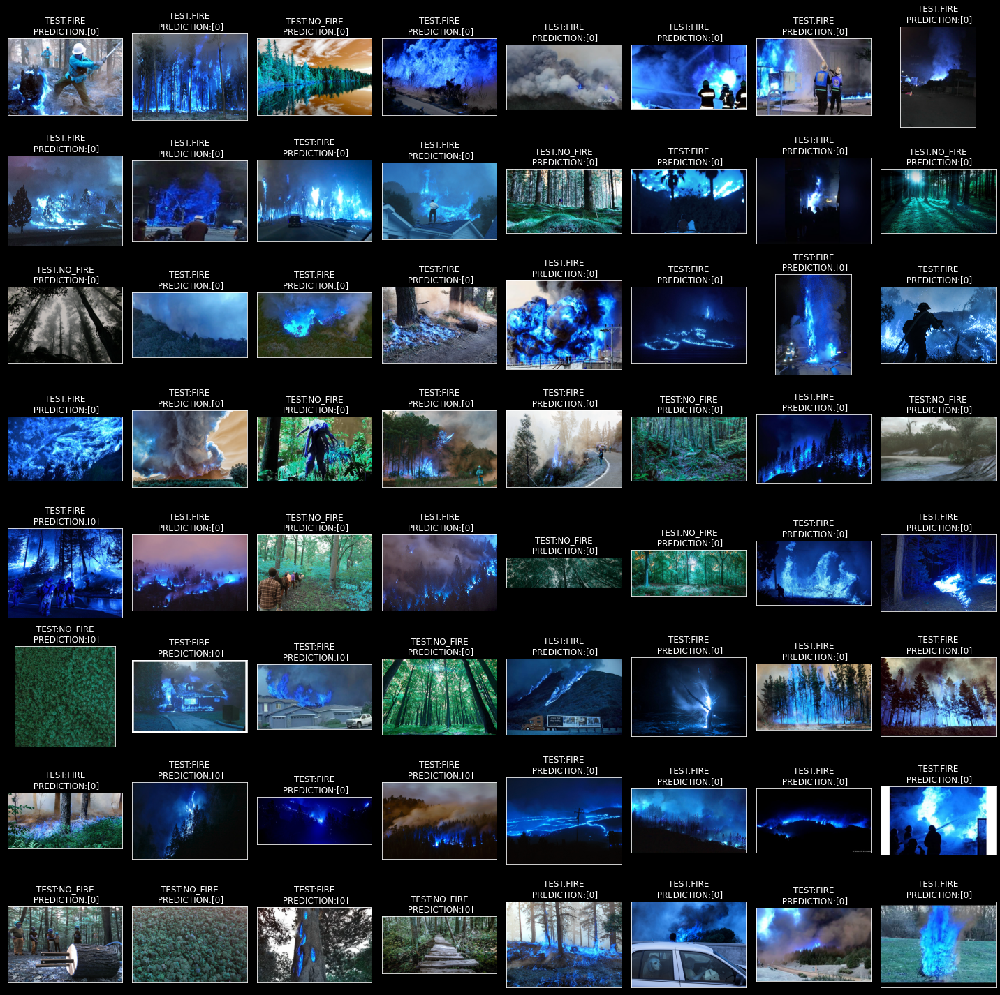

In [100]:
fig, axes = plt.subplots(nrows=8,
                         ncols=8,
                         figsize=(20, 20),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(cv2.imread(Test_Data["PNG"].iloc[i]))
    ax.set_title(f"TEST:{Test_Data.CATEGORY.iloc[i]}\n PREDICTION:{Predict_Class[i]}")
plt.tight_layout()
plt.show()

In [101]:
print(confusion_matrix(For_Prediction_Class,Predict_Class))

[[69  0]
 [31  0]]


- Not fire

In [105]:
image_path = "C:/Users/DELL/OneDrive/Documents/StarAgile/Assessment/Capstone Project/Forest fire prediction/Images/non_fire_images/non_fire.1.png"
img = tf.keras.utils.load_img(image_path,target_size=(256,256))
x = tf.keras.utils.img_to_array(img)
x = np.expand_dims(x,axis=0)

In [106]:
Diff_Pred = Model.predict(x)
Diff_Pred = Diff_Pred.argmax(axis=-1)
print(Diff_Pred)

1/1 [==============================] - 0s 158ms/step
[0]


- Fire

In [107]:
image_path_Two = "C:/Users/DELL/OneDrive/Documents/StarAgile/Assessment/Capstone Project/Forest fire prediction/Images/fire_images/fire.1.png"
img_Two = tf.keras.utils.load_img(image_path_Two,target_size=(256,256))
x_Two = tf.keras.utils.img_to_array(img_Two)
x_Two = np.expand_dims(x_Two,axis=0)

In [108]:
Diff_Pred_Two = Model.predict(x_Two)
Diff_Pred_Two = Diff_Pred_Two.argmax(axis=-1)
print(Diff_Pred_Two)

1/1 [==============================] - 0s 73ms/step
[0]


## Fully Connected

In [109]:
Model_Two = tf.keras.models.Sequential([
  # inputs 
  tf.keras.layers.experimental.preprocessing.Rescaling(1./255),
  tf.keras.layers.Flatten(input_shape=(256,)),
  # hiddens layers
  tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
  tf.keras.layers.Dropout(0.2),
  # output layer
  tf.keras.layers.Dense(2,activation="softmax")
])

In [110]:
Model_Two.compile(optimizer = 'adam' , loss = 'categorical_crossentropy' , metrics = ['accuracy'])

In [111]:
ANN_Model = Model_Two.fit(Train_IMG_Set,
                          validation_data=Validation_IMG_Set,
                          callbacks=Call_Back,
                      epochs=100)

Epoch 1/100
26/26 [==============================] - 49s 2s/step - loss: 0.4920 - accuracy: 0.7531 - val_loss: 0.3532 - val_accuracy: 0.7978
Epoch 2/100
26/26 [==============================] - 45s 2s/step - loss: 0.3465 - accuracy: 0.8481 - val_loss: 0.2575 - val_accuracy: 0.9101
Epoch 3/100
26/26 [==============================] - 46s 2s/step - loss: 0.2628 - accuracy: 0.9025 - val_loss: 0.1942 - val_accuracy: 0.9326
Epoch 4/100
26/26 [==============================] - 45s 2s/step - loss: 0.2530 - accuracy: 0.9012 - val_loss: 0.1862 - val_accuracy: 0.9438
Epoch 5/100
26/26 [==============================] - 54s 2s/step - loss: 0.2309 - accuracy: 0.9160 - val_loss: 0.1682 - val_accuracy: 0.9326
Epoch 6/100
26/26 [==============================] - 49s 2s/step - loss: 0.2029 - accuracy: 0.9284 - val_loss: 0.1609 - val_accuracy: 0.9213
Epoch 7/100
26/26 [==============================] - 46s 2s/step - loss: 0.1853 - accuracy: 0.9383 - val_loss: 0.1410 - val_accuracy: 0.9326
Epoch 8/100
2

In [112]:
print(Model_Two.summary())

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, None, None, None)  0         
                                                                 
 flatten_2 (Flatten)         (None, None)              0         
                                                                 
 dense_4 (Dense)             (None, 128)               25165952  
                                                                 
 dense_5 (Dense)             (None, 64)                8256      
                                                                 
 dropout_6 (Dropout)         (None, 64)                0         
                                                                 
 dense_6 (Dense)             (None, 2)                 130       
                                                                 
Total params: 25,174,338
Trainable params: 25,174,338


In [114]:
Model_Results_Two = Model_Two.evaluate(Test_IMG_Set)
print("LOSS:  " + "%.4f" % Model_Results_Two[0])
print("ACCURACY:  " + "%.2f" % Model_Results_Two[1])

4/4 [==============================] - 5s 974ms/step - loss: 0.1938 - accuracy: 0.9500
LOSS:  0.1938
ACCURACY:  0.95


No handles with labels found to put in legend.


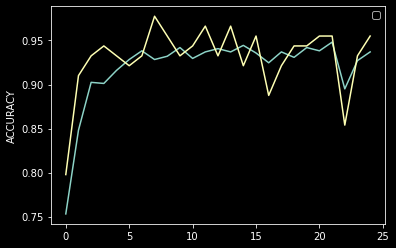

In [115]:
plt.plot(ANN_Model.history["accuracy"])
plt.plot(ANN_Model.history["val_accuracy"])
plt.ylabel("ACCURACY")
plt.legend()
plt.show()

No handles with labels found to put in legend.


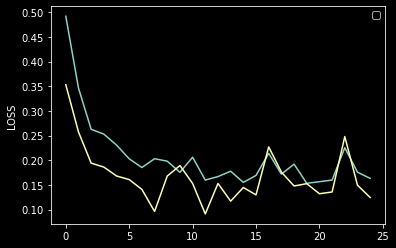

In [116]:
plt.plot(ANN_Model.history["loss"])
plt.plot(ANN_Model.history["val_loss"])
plt.ylabel("LOSS")
plt.legend()
plt.show()

No handles with labels found to put in legend.


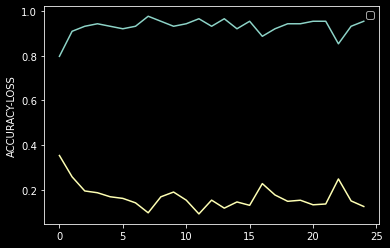

In [117]:
plt.plot(ANN_Model.history["val_accuracy"])
plt.plot(ANN_Model.history["val_loss"])
plt.ylabel("ACCURACY-LOSS")
plt.legend()
plt.show()

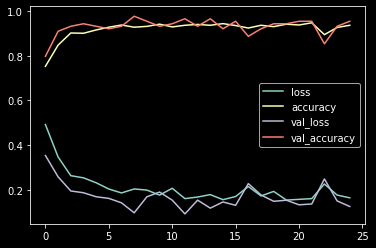

In [118]:
Dict_Summary_Two = pd.DataFrame(ANN_Model.history)
Dict_Summary_Two.plot()

#### Prediction

In [119]:
Prediction_Two = Model_Two.predict(Test_IMG_Set)
Prediction_Two = Prediction_Two.argmax(axis=-1)

4/4 [==============================] - 5s 1s/step


In [120]:
print(Prediction_Two)

[0 1 1 1 1 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 1 1 1 0 0 0 1 0 1 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0
 0 0 1 0 0 1 1 0 1 0 0 0 1 0 1 0 0 1 0 0 0 0 1 1 0 0]


- 'FIRE': 0 
- 'NO_FIRE': 1

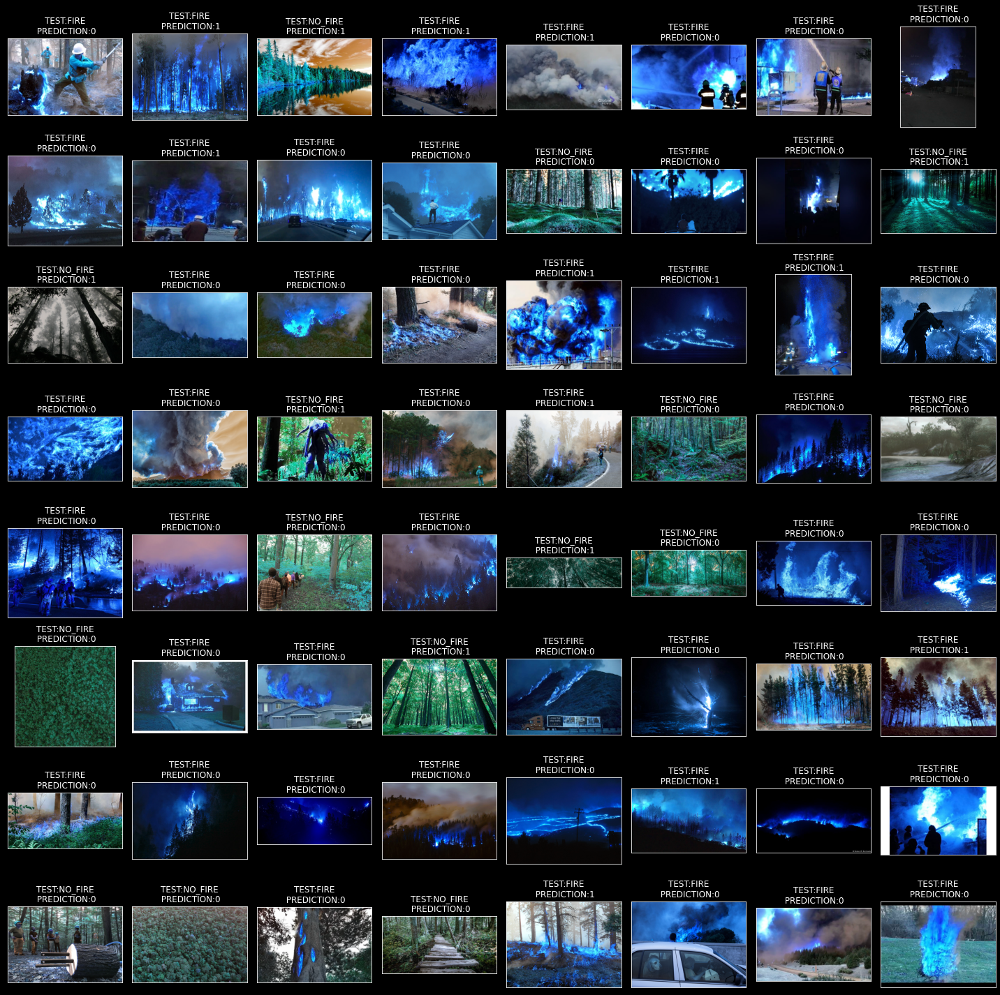

In [122]:
fig, axes = plt.subplots(nrows=8,
                         ncols=8,
                         figsize=(20, 20),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(cv2.imread(Test_Data["PNG"].iloc[i]))
    ax.set_title(f"TEST:{Test_Data.CATEGORY.iloc[i]}\n PREDICTION:{Prediction_Two[i]}")
plt.tight_layout()
plt.show()

#### PREDICTION FOR ANOTHER SOURCE

- Non - Fire

In [129]:
image_path = "C:/Users/DELL/OneDrive/Documents/StarAgile/Assessment/Capstone Project/Forest fire prediction/Images/non_fire_images/non_fire.52.png"
img = tf.keras.utils.load_img(image_path,target_size=(256,256))
x = tf.keras.utils.img_to_array(img)
x = np.expand_dims(x,axis=0)

In [130]:
Diff_Pred = Model_Two.predict(x)
Diff_Pred = Diff_Pred.argmax(axis=-1)
print(Diff_Pred)

1/1 [==============================] - 0s 56ms/step
[1]


- Fire

In [131]:
image_path_Two = "C:/Users/DELL/OneDrive/Documents/StarAgile/Assessment/Capstone Project/Forest fire prediction/Images/fire_images/fire.27.png"
img_Two = tf.keras.utils.load_img(image_path_Two,target_size=(256,256))
x_Two = tf.keras.utils.img_to_array(img_Two)
x_Two = np.expand_dims(x_Two,axis=0)

In [132]:
Diff_Pred_Two = Model_Two.predict(x_Two)
Diff_Pred_Two = Diff_Pred_Two.argmax(axis=-1)
print(Diff_Pred_Two)

1/1 [==============================] - 0s 26ms/step
[0]


## CNN-RCNN

In [133]:
Model_Three = Sequential()

Model_Three.add(Conv2D(12,(3,3),activation="relu",
                 input_shape=(256,256,3)))
Model_Three.add(BatchNormalization())
Model_Three.add(MaxPooling2D((2,2)))

#
Model_Three.add(Conv2D(24,(3,3),
                 activation="relu"))
Model_Three.add(Dropout(0.2))
Model_Three.add(MaxPooling2D((2,2)))


#
Model_Three.add(TimeDistributed(Flatten()))
Model_Three.add(Bidirectional(LSTM(32,
                                  return_sequences=True,
                                  dropout=0.5,
                                  recurrent_dropout=0.5)))
Model_Three.add(Bidirectional(GRU(32,
                                  return_sequences=True,
                                  dropout=0.5,
                                  recurrent_dropout=0.5)))

#
Model_Three.add(Flatten())

Model_Three.add(Dense(256,activation="relu"))
Model_Three.add(Dropout(0.5))
Model_Three.add(Dense(2,activation="softmax"))


In [134]:
Model_Three.compile(optimizer = 'adam' , loss = 'categorical_crossentropy' , metrics = ['accuracy'])

In [135]:
RCNN_Model = Model_Three.fit(Train_IMG_Set,
                          validation_data=Validation_IMG_Set,
                          callbacks=Call_Back,
                      epochs=100)

Epoch 1/100
26/26 [==============================] - 96s 3s/step - loss: 0.3389 - accuracy: 0.8519 - val_loss: 0.6512 - val_accuracy: 0.7640
Epoch 2/100
26/26 [==============================] - 85s 3s/step - loss: 0.1771 - accuracy: 0.9358 - val_loss: 0.4158 - val_accuracy: 0.7640
Epoch 3/100
26/26 [==============================] - 78s 3s/step - loss: 0.1717 - accuracy: 0.9383 - val_loss: 0.8970 - val_accuracy: 0.7640
Epoch 4/100
26/26 [==============================] - 77s 3s/step - loss: 0.1756 - accuracy: 0.9333 - val_loss: 1.1211 - val_accuracy: 0.7640
Epoch 5/100
26/26 [==============================] - 77s 3s/step - loss: 0.1344 - accuracy: 0.9494 - val_loss: 0.5733 - val_accuracy: 0.7640
Epoch 6/100
26/26 [==============================] - 81s 3s/step - loss: 0.1239 - accuracy: 0.9605 - val_loss: 0.5504 - val_accuracy: 0.7865
Epoch 7/100
26/26 [==============================] - 89s 3s/step - loss: 0.1408 - accuracy: 0.9432 - val_loss: 0.4388 - val_accuracy: 0.7865
Epoch 8/100
2

In [136]:
print(Model_Three.summary())

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 254, 254, 12)      336       
                                                                 
 batch_normalization_2 (Batc  (None, 254, 254, 12)     48        
 hNormalization)                                                 
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 127, 127, 12)     0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 125, 125, 24)      2616      
                                                                 
 dropout_7 (Dropout)         (None, 125, 125, 24)      0         
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 62, 62, 24)      

In [137]:
Model_Results_Three = Model_Three.evaluate(Test_IMG_Set)
print("LOSS:  " + "%.4f" % Model_Results_Three[0])
print("ACCURACY:  " + "%.2f" % Model_Results_Three[1])

4/4 [==============================] - 6s 1s/step - loss: 0.3915 - accuracy: 0.7800
LOSS:  0.3915
ACCURACY:  0.78


No handles with labels found to put in legend.


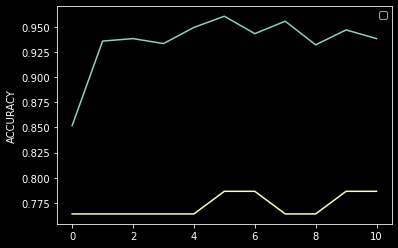

In [138]:
plt.plot(RCNN_Model.history["accuracy"])
plt.plot(RCNN_Model.history["val_accuracy"])
plt.ylabel("ACCURACY")
plt.legend()
plt.show()

No handles with labels found to put in legend.


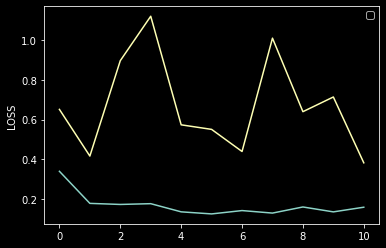

In [139]:
plt.plot(RCNN_Model.history["loss"])
plt.plot(RCNN_Model.history["val_loss"])
plt.ylabel("LOSS")
plt.legend()
plt.show()

No handles with labels found to put in legend.


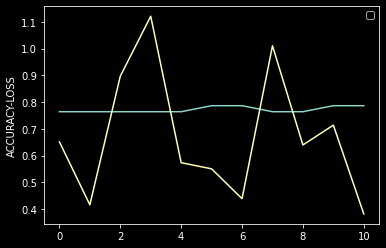

In [140]:
plt.plot(RCNN_Model.history["val_accuracy"])
plt.plot(RCNN_Model.history["val_loss"])
plt.ylabel("ACCURACY-LOSS")
plt.legend()
plt.show()

In [141]:
Prediction_Three = Model_Three.predict(Test_IMG_Set)
Prediction_Three = Prediction_Three.argmax(axis=-1)

4/4 [==============================] - 7s 1s/step


In [142]:
print(Prediction_Three)

[0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0]


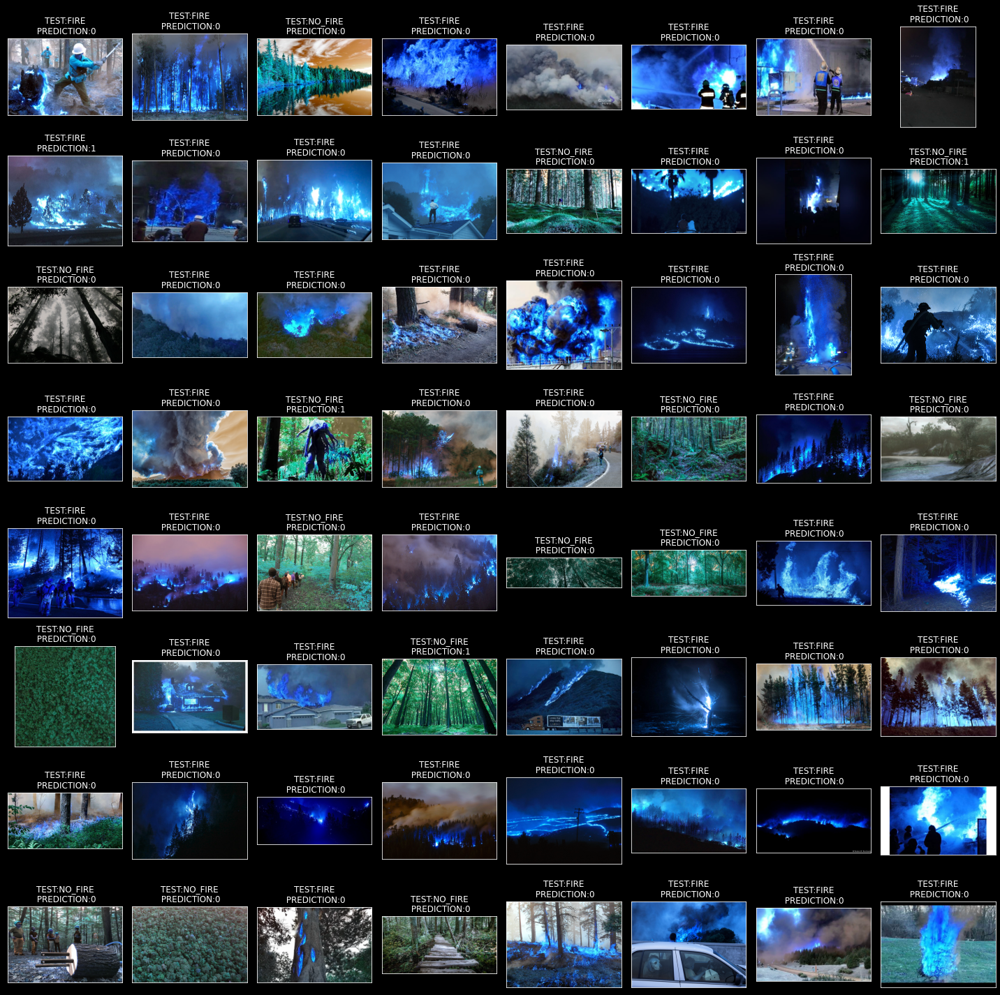

In [144]:
fig, axes = plt.subplots(nrows=8,
                         ncols=8,
                         figsize=(20, 20),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(cv2.imread(Test_Data["PNG"].iloc[i]))
    ax.set_title(f"TEST:{Test_Data.CATEGORY.iloc[i]}\n PREDICTION:{Prediction_Three[i]}")
plt.tight_layout()
plt.show()

- No Fire

In [151]:
image_path = "C:/Users/DELL/OneDrive/Documents/StarAgile/Assessment/Capstone Project/Forest fire prediction/Images/non_fire_images/non_fire.54.png"
img = tf.keras.utils.load_img(image_path,target_size=(256,256))
x = tf.keras.utils.img_to_array(img)
x = np.expand_dims(x,axis=0)

In [152]:
Diff_Pred = Model_Three.predict(x)
Diff_Pred = Diff_Pred.argmax(axis=-1)
print(Diff_Pred)

1/1 [==============================] - 0s 59ms/step
[1]


- Fire

In [147]:
image_path = "C:/Users/DELL/OneDrive/Documents/StarAgile/Assessment/Capstone Project/Forest fire prediction/Images/fire_images/fire.27.png"
img = tf.keras.utils.load_img(image_path,target_size=(256,256))
x = tf.keras.utils.img_to_array(img_Two)
x = np.expand_dims(x_Two,axis=0)

In [148]:
Diff_Pred_Three = Model_Three.predict(x_Two)
Diff_Pred_Three = Diff_Pred_Three.argmax(axis=-1)
print(Diff_Pred_Three)

1/1 [==============================] - 0s 69ms/step
[0]


## Conclusion

- Compared CNN & RCNN, Fully connected layer algorithm has better accuracy and given the better results. 